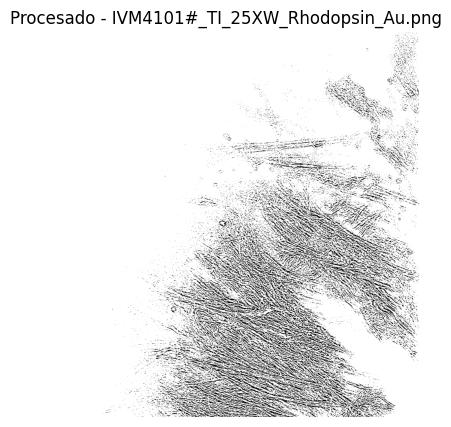

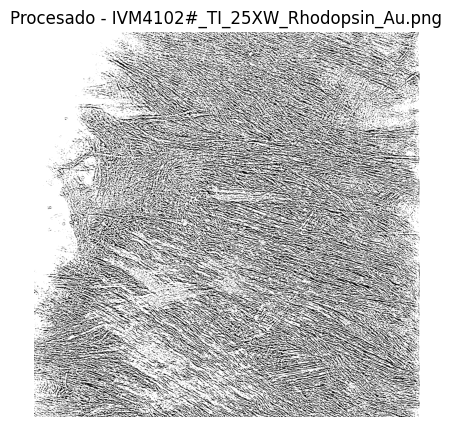

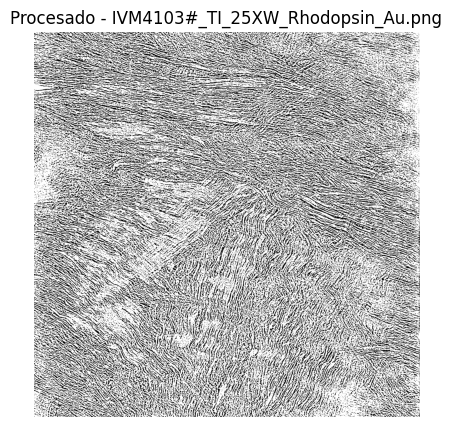

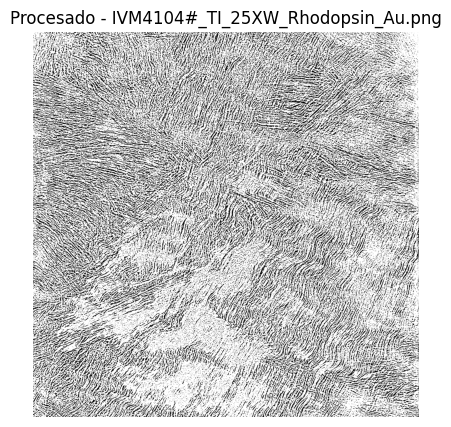

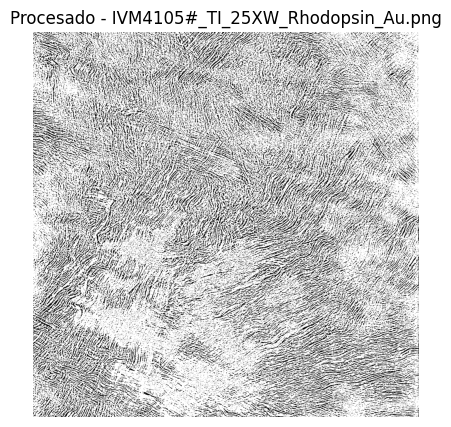

...

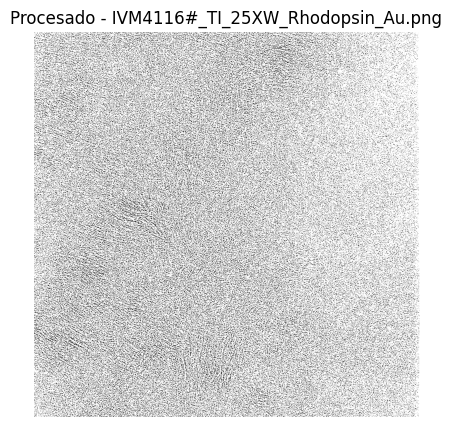

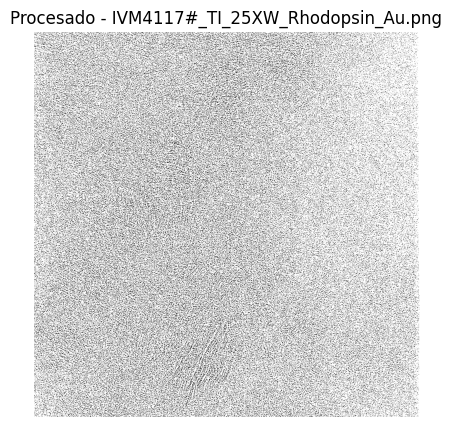

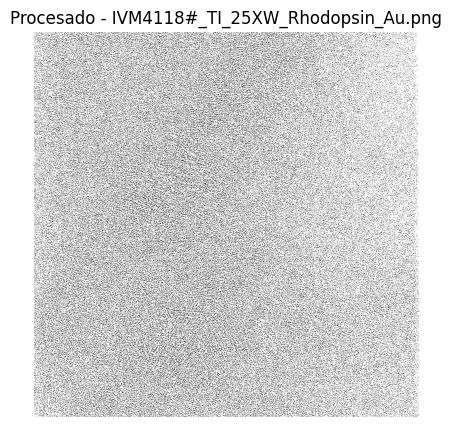

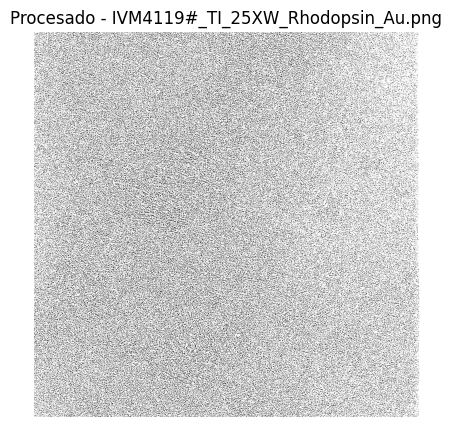

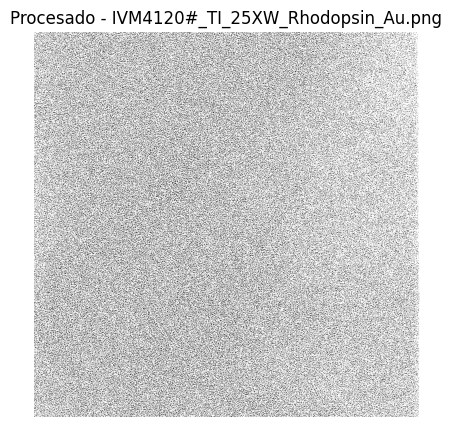

C:\Users\danwo\AppData\Local\Temp\ipykernel_11752\3567614661.py:45: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(modelo_FRAP, t, I, p0=[1, 10, 0])


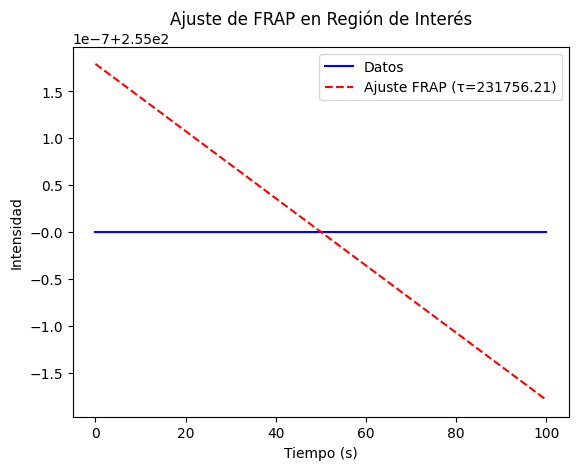

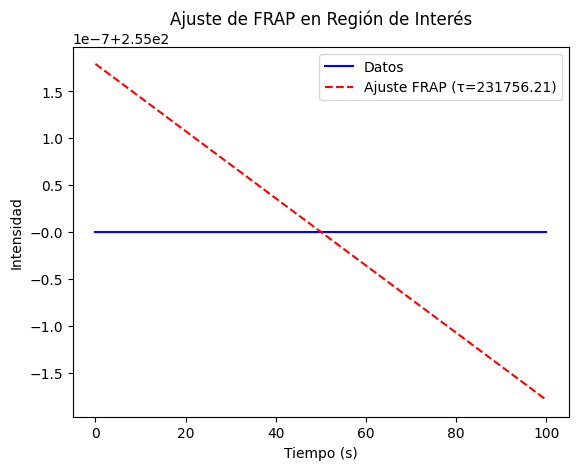

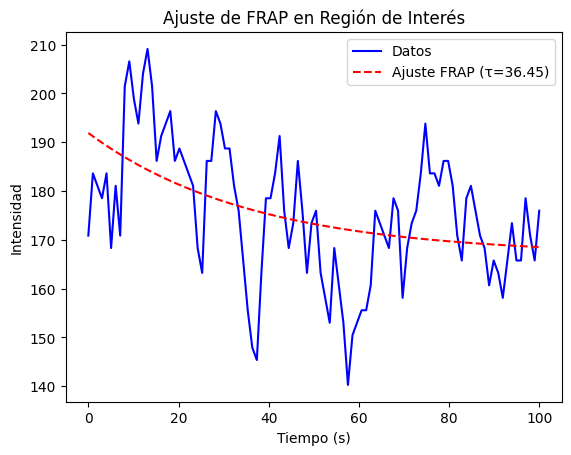

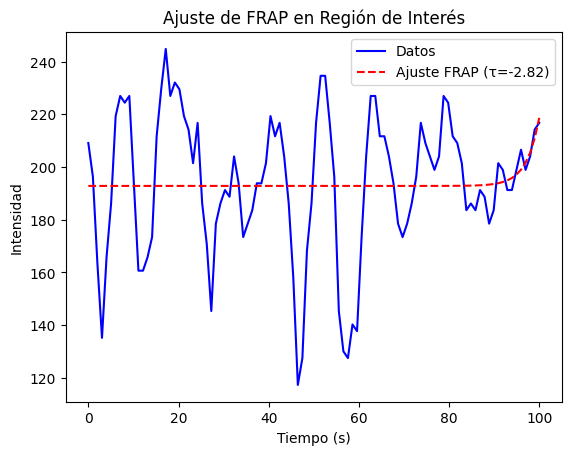

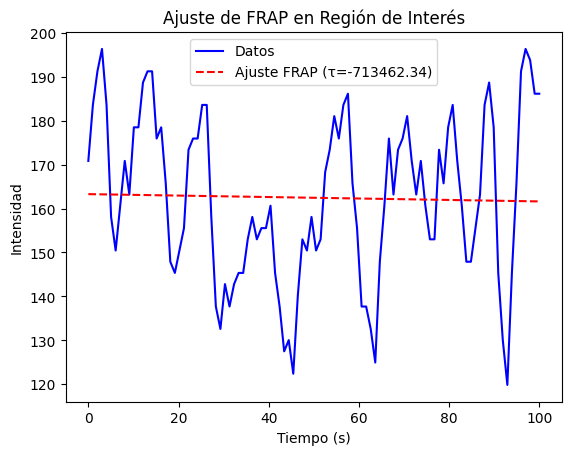

...

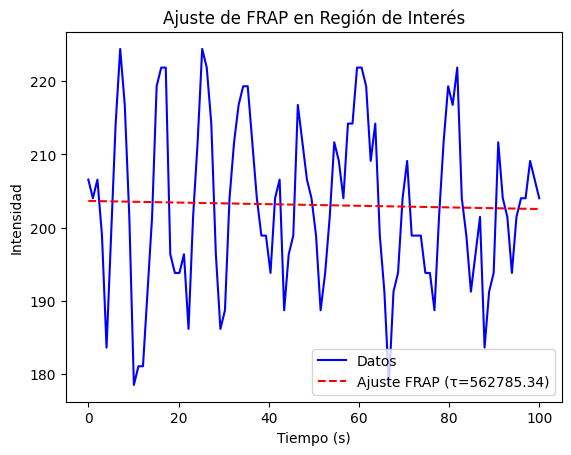

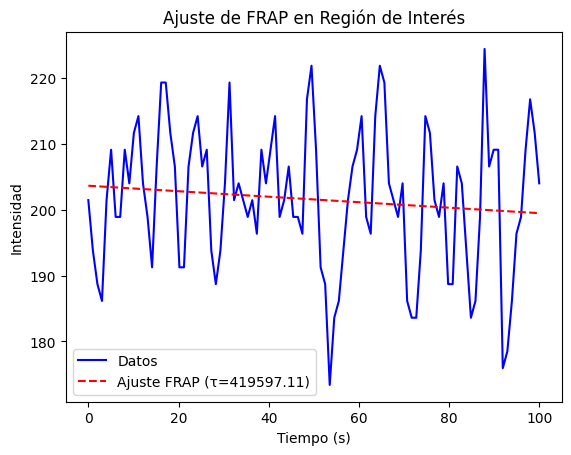

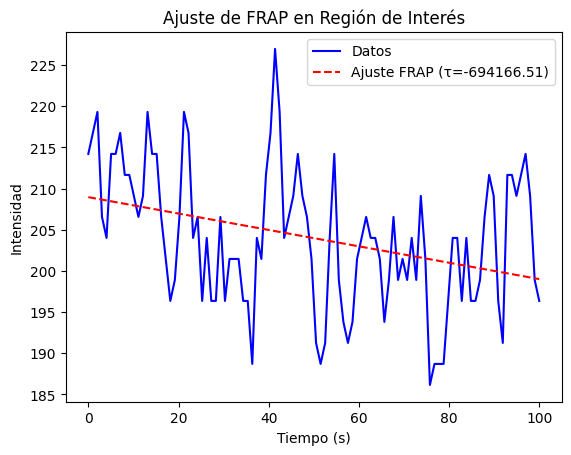

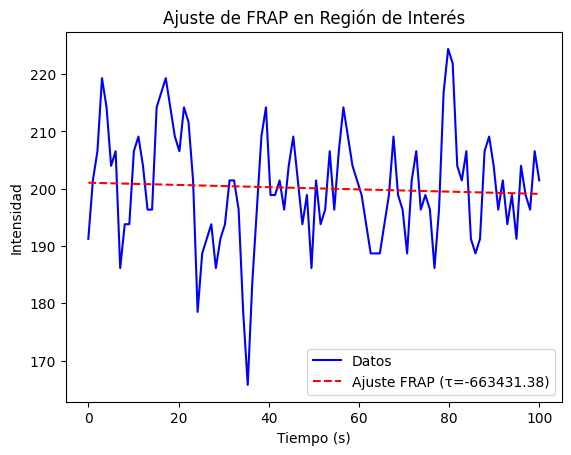

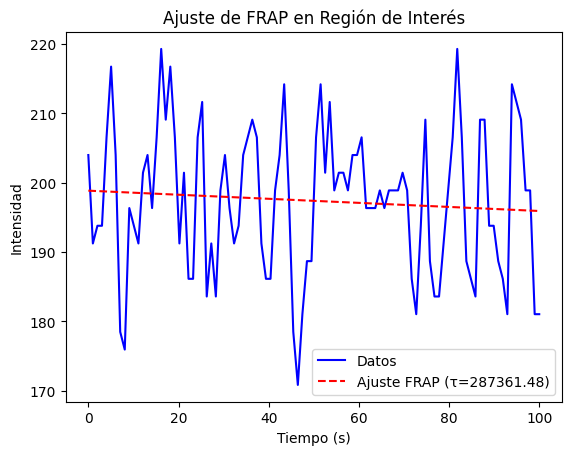

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Directorio donde se encuentran las imágenes
directorio_imagenes = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"

# Lista de nombres de archivos en el directorio de imágenes
archivos_imagenes = [f for f in os.listdir(directorio_imagenes) if f.endswith(('png', 'jpg', 'jpeg'))]

# Función para cargar y procesar imágenes
def procesar_imagenes(directorio):
    datos_FRAP = []
    for archivo in archivos_imagenes:
        ruta_completa = os.path.join(directorio, archivo)
        imagen = cv2.imread(ruta_completa, cv2.IMREAD_GRAYSCALE)
        
        # Aplicar un filtro para mejorar la visualización de fibras de colágeno
        imagen_procesada = cv2.GaussianBlur(imagen, (5, 5), 0)
        imagen_umbral = cv2.adaptiveThreshold(imagen_procesada, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                              cv2.THRESH_BINARY, 11, 2)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(imagen_umbral, cmap='gray')
        plt.title(f'Procesado - {archivo}')
        plt.axis('off') # Ocultar ejes
        plt.show()
        
        # Selección de región de interés (ROI) para análisis FRAP
        roi = imagen_umbral[50:150, 50:150]  # Se puede ajustar según el experimento
        intensidad_promedio = np.mean(roi, axis=0)
        
        tiempo = np.linspace(0, 100, num=len(intensidad_promedio))
        datos_FRAP.append((tiempo, intensidad_promedio))
    
    return datos_FRAP

# Función para ajustar la curva de FRAP
def modelo_FRAP(t, a, tau, c):
    return a * (1 - np.exp(-t / tau)) + c

def ajustar_curva_FRAP(t, I):
    popt, pcov = curve_fit(modelo_FRAP, t, I, p0=[1, 10, 0])
    return popt, pcov

# Procesar imágenes
datos_FRAP = procesar_imagenes(directorio_imagenes)

# Ajustar la curva de FRAP para una de las imágenes procesadas
for t, I in datos_FRAP:
    popt, pcov = ajustar_curva_FRAP(t, I)
    plt.plot(t, I, 'b-', label='Datos')
    plt.plot(t, modelo_FRAP(t, *popt), 'r--', label=f'Ajuste FRAP (τ={popt[1]:.2f})')
    plt.title('Ajuste de FRAP en Región de Interés')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Intensidad')
    plt.legend()
    plt.show()
